# Basic TD-IDF Content Recommendations
Following this [Building a podcast recommendation engine](https://www.kaggle.com/switkowski/building-a-podcast-recommendation-engine)

### Dataset
The dataset required for this notebook can be found here: [All Podcast Episodes Published in December 2017](https://www.kaggle.com/listennotes/all-podcast-episodes-published-in-december-2017)

This notebook expects two files:
- `datasets/2017-podcasts/episodes.csv`
- `datasets/2017-podcasts/podcasts.csv`

In [30]:
import numpy as np
import pandas as pd

podcasts = pd.read_csv('../datasets/2017-podcasts/podcasts.csv')
podcasts.head()

,uuid,title,image,description,language,categories,website,author,itunes_id
0,8d62d3880db2425b890b986e58aca393,"Ecommerce Conversations, by Practical Ecommerce",http://is4.mzstatic.com/image/thumb/Music6/v4/...,Listen in as the Practical Ecommerce editorial...,English,Technology,http://www.practicalecommerce.com,Practical Ecommerce,874457373
1,cbbefd691915468c90f87ab2f00473f9,Eat Sleep Code Podcast,http://is4.mzstatic.com/image/thumb/Music71/v4...,On the show we’ll be talking to passionate peo...,English,Tech News | Technology,http://developer.telerik.com/,Telerik,1015556393
2,73626ad1edb74dbb8112cd159bda86cf,SoundtrackAlley,http://is5.mzstatic.com/image/thumb/Music71/v4...,A podcast about soundtracks and movies from my...,English,Podcasting | Technology,https://soundtrackalley.podbean.com,Randy Andrews,1158188937
3,0f50631ebad24cedb2fee80950f37a1a,The Tech M&A Podcast,http://is1.mzstatic.com/image/thumb/Music71/v4...,The Tech M&A Podcast pulls from the best of th...,English,Business News | Technology | Tech News | Business,http://www.corumgroup.com,Timothy Goddard,538160025
4,69580e7b419045839ca07af06cf0d653,"The Tech Informist - For fans of Apple, Google...",http://is4.mzstatic.com/image/thumb/Music62/v4...,The tech news show with two guys shooting the ...,English,Gadgets | Tech News | Technology,http://techinformist.com,The Tech Informist,916080498


In [31]:
episodes = pd.read_csv('../datasets/2017-podcasts/episodes.csv')
episodes.head()

,title,audio,audio_length,description,pub_date,uuid,podcast_uuid
0,Piątek - 01 grudnia,https://cdneu.modlitwawdrodze.pl/prayers/MWD_2...,490,"święci męczennicy jezuiccy Edmund Campion SJ, ...",2017-12-01 00:00:00+00,fd5d891411174c7ca953c1f54657c3eb,811c18cf575841b3bef4601978f17ca9
1,Sobota - 02 grudnia,https://cdneu.modlitwawdrodze.pl/prayers/MWD_2...,481,"bł. Rafał Chyliński, prezbiter, Łk 21, 34-36",2017-12-02 00:00:00+00,5c28fa0a27b342cd92ff03c16a8019c2,811c18cf575841b3bef4601978f17ca9
2,Niedziela - 03 grudnia,https://cdneu.modlitwawdrodze.pl/prayers/MWD_2...,667,"Pierwsza Niedziela Adwentu, Mk 13, 33-37",2017-12-03 00:00:00+00,efdc9f4f07fa4c4883f8848256066cec,811c18cf575841b3bef4601978f17ca9
3,Introduction to Luke,http://www.wgcr.net/images/TimelessTruths/TTT-...,1691,Luke 1:1-4 -,2017-12-03 11:30:05+00,cc2860165fa84d1092f6b45f19255a87,36ed4e62dcd94412a5211cc9bd76ba7c
4,"Dear Science: Lightning, Dead Cats and Hand Sa...",http://95bfm.com/sites/default/files/291117_De...,1152,<p>Today on Dear Science with AUT's Allan Blac...,2017-12-27 11:00:00+00,69bd409e0469433581ccc76cf7b664ad,fa36a26a1879453f95da1379c737cd6d


In [32]:
print(podcasts["language"].value_counts())

# Let's only work with english podcasts
podcasts = podcasts[podcasts.language == "English"]

# Filter out podcasts w/o descriptions
podcasts = podcasts.dropna(subset=['description'])

# Filter out possible duplicates
podcasts = podcasts.drop_duplicates('itunes_id')


English             99316
German               4316
French               3874
Spanish              3637
Portuguese           1827
Swedish              1698
Chinese              1329
Japanese             1097
Italian               818
Russian               602
Dutch                 531
Norwegian             435
Danish                337
Korean                190
Finnish               157
Polish                145
Estonian              128
Czech                 119
Turkish               116
Catalan                93
Slovenian              79
Hungarian              72
Romanian               39
Galician               37
Ukranian               30
Slovak                 22
Swahili                21
Indonesian             19
Icelandic              13
Basque                 13
Greek                  13
Afrikaans              13
Bulgarian               9
Serbian                 8
Albanian                6
Croatian                5
Abkhazian               3
Irish                   3
Faeroese    

In [40]:
podcasts['description_length'] = [len(x.description.split()) for _, x in podcasts.iterrows()]
podcasts['description_length'].describe()

count    98173.000000
mean        39.168753
std        107.098547
min          0.000000
25%         11.000000
50%         26.000000
75%         51.000000
max      30157.000000
Name: description_length, dtype: float64

In [41]:
# Only consider podcasts with >20 words
podcasts = podcasts[podcasts.description_length >= 20]

In [55]:
favorite_podcasts = ['Eat Sleep Code Podcast', 'The Tech M&A Podcast','UU Church of Kent Ohio']
favorites = podcasts[podcasts.title.isin(favorite_podcasts)]
favorites

,uuid,title,image,description,language,categories,website,author,itunes_id,description_length
1,cbbefd691915468c90f87ab2f00473f9,Eat Sleep Code Podcast,http://is4.mzstatic.com/image/thumb/Music71/v4...,On the show we’ll be talking to passionate peo...,English,Tech News | Technology,http://developer.telerik.com/,Telerik,1015556393,59
3,0f50631ebad24cedb2fee80950f37a1a,The Tech M&A Podcast,http://is1.mzstatic.com/image/thumb/Music71/v4...,The Tech M&A Podcast pulls from the best of th...,English,Business News | Technology | Tech News | Business,http://www.corumgroup.com,Timothy Goddard,538160025,59
158,0779781047554af181fc912e34c952f3,UU Church of Kent Ohio,http://is4.mzstatic.com/image/thumb/Music62/v4...,"Our mission is to inspire love, to seek justic...",English,Religion & Spirituality | Spirituality,http://kentuu.org/#Podcast,UU Church of Kent Ohio,897713449,50


In [64]:
# Only sample 15k podcasts, too many
podcasts = podcasts[~podcasts.isin(favorites)].sample(15000)

podcasts = podcasts[~podcasts.description.isna()]
data = pd.concat([podcasts, favorites], sort = True).reset_index(drop = True)

In [65]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

tf = TfidfVectorizer(analyzer = 'word', ngram_range = (1, 3), min_df = 0, stop_words = "english")

# Returns document-term matrix
tf_idf = tf.fit_transform(data['description'].astype('string'))
tf_idf

<15002x851774 sparse matrix of type '<class 'numpy.float64'>'
	with 1370125 stored elements in Compressed Sparse Row format>

In [68]:
# X^T X (Gram Matrix)
similarity = linear_kernel(tf_idf, tf_idf)
similarity

array([[1.00000000e+00, 0.00000000e+00, 4.32974120e-03, ...,
        6.55774271e-03, 4.61342434e-03, 2.68665395e-03],
       [0.00000000e+00, 1.00000000e+00, 3.12848932e-03, ...,
        3.54319333e-03, 0.00000000e+00, 5.25775234e-03],
       [4.32974120e-03, 3.12848932e-03, 1.00000000e+00, ...,
        1.15710509e-03, 0.00000000e+00, 2.53455180e-03],
       ...,
       [6.55774271e-03, 3.54319333e-03, 1.15710509e-03, ...,
        1.00000000e+00, 9.21142985e-04, 4.47448711e-03],
       [4.61342434e-03, 0.00000000e+00, 0.00000000e+00, ...,
        9.21142985e-04, 1.00000000e+00, 1.98826108e-03],
       [2.68665395e-03, 5.25775234e-03, 2.53455180e-03, ...,
        4.47448711e-03, 1.98826108e-03, 1.00000000e+00]])

In [69]:
similarity.shape

(15002, 15002)

In [72]:
# Finding similar podcasts to "Eat Sleep Code Podcast"
x = data[data.title == 'Eat Sleep Code Podcast'].index[0]
similar_idx = similarity[x].argsort(axis = 0)[-4:-1]
for i in similar_idx:
    print(similarity[x][i], '-', data.title[i], '-', data.description[i], '\n')
print('Original - ' + data.description[x])

0.06323458049611806 - Stackify Developer Things - Stackify's Developer Things podcast covers a wide range of software development topics including application performance, DevOps, cloud computing, and cool things developers love. Hosted by Stackify's founder and CEO Matt Watson. 

0.06357755826672082 - Developing Up - A podcast focused on the non-technical side of being a developer, because your career is about more than the code you write. 

0.0751147928280892 - Soft Skills Engineering - It takes more than great code to be a great engineer. Soft Skills Engineering is a weekly question and answer podcast where software developer hosts answer questions about all of the non-technical things that go along with being a software developer. 

Original - On the show we’ll be talking to passionate people about a wide range of developer related topics.

Part of the Telerik Developer Network , Eat Sleep Code is the Official Telerik Podcast. At Telerik we believe in giving back to the developer c

# Playing around with `TfidfVectorizer.fit`

In [83]:
# Trying something a little different from the tutorial
new_tf_idf = TfidfVectorizer(analyzer = 'word', ngram_range = (1, 3), min_df = 0, stop_words = "english")

# Returns document-term matrix
new_tf_idf.fit(data['description'].astype('string'))

TfidfVectorizer(min_df=0, ngram_range=(1, 3), stop_words='english')

In [86]:
# podcasts[~podcasts.title.isin(data)].title
podcast_not_in_original_td_idf = "Podcast Your Data"
desc = podcasts[podcasts.title == podcast_not_in_original_td_idf].description
features = new_tf_idf.transform(desc)

In [88]:
# Similar to itself
linear_kernel(features, features)

array([[1.]])

In [97]:
tech_ma_podcast_desc = data[data.title =="The Tech M&A Podcast"].description
religion_podcast_desc = data[data.title =="UU Church of Kent Ohio"].description

tech_ma_features = new_tf_idf.transform(tech_ma_podcast_desc)
religion_podcast_features = new_tf_idf.transform(religion_podcast_desc)

# Similarity between "Podcast Your Data" and "The Tech M&A Podcast"
print(linear_kernel(features, tech_ma_features))

# Similarity between "Podcast Your Data" and "UU Church of Kent Ohio"
print(linear_kernel(features, religion_podcast_features))

[[0.00461342]]
[[0.00268665]]


# Playing around with Dimensionality Reduction using `t-SNE`

In [100]:
from sklearn.manifold import TSNE

embedded = TSNE(n_components=2).fit_transform(tf_idf)
embedded.shape

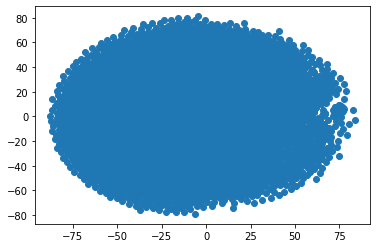

In [212]:
import matplotlib.pyplot as plt

plt.scatter(embedded[:,0], embedded[:, 1])


In [218]:
def plot_similarity(podcast_title):
    x = data[data.title == podcast_title].index[0]
    embedded_wo_x = np.vstack((embedded[0:x], embedded[x + 1:]))
    n = embedded_wo_x.shape[0]

    # Calculate alphas (normalize to 0-1)
    similarity_wo_x = np.hstack((similarity[x][0:x], similarity[x][x+1:]))
    alphas = similarity_wo_x
    alphas_min = alphas.min()
    alphas_max = alphas.max()
    alphas = (alphas - alphas_min) / (alphas_max - alphas_min)

    # RGB 153, 204, 255
    colors = np.zeros((n, 4))
    colors[:, 0] = np.full(shape=n, fill_value=153/255)
    colors[:, 1] = np.full(shape=n, fill_value=204/255)
    colors[:, 2] = np.full(shape=n, fill_value=255/255)
    colors[:, 3] = alphas

    plt.scatter(embedded_wo_x[:,0], embedded_wo_x[:,1], c=colors)
    plt.scatter(embedded[x,0], embedded[x,1],c=[[0,0,0,1]])
    plt.title(podcast_title)
    plt.show()

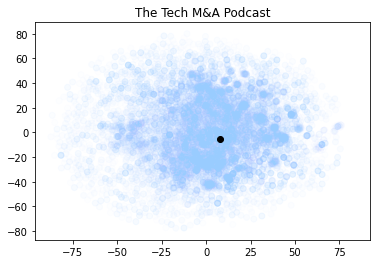

In [219]:
plot_similarity('The Tech M&A Podcast')

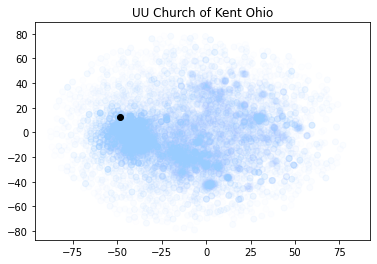

In [223]:
plot_similarity('UU Church of Kent Ohio')

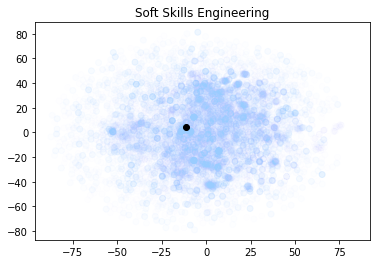

In [221]:
plot_similarity('Soft Skills Engineering')

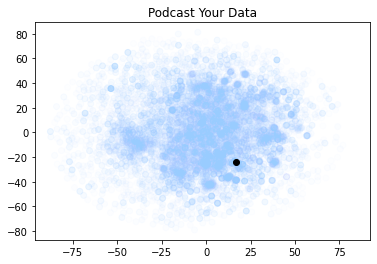

In [222]:
plot_similarity('Podcast Your Data')

In [210]:
podcasts.title

75620                         Podcast Your Data
120529                         ChristWay Church
107996                     Get Yourself the Job
46923     Draft Sharks Fantasy Football Podcast
38030          Podcast - Journey Uniting Church
                          ...                  
103250                5 Gays 1 Girl & A Podcast
33830                    Beston & Greenway Show
90155                                   Msprity
90569               General Fitness Companycast
93824                         Evergreen Podcast
Name: title, Length: 14999, dtype: object